# Part A: Run Following Section for Needed Functions

In [10]:
# !pip install --upgrade --no-cache-dir gdown
# !pip install pytorch_lightning &> /dev/null
# !gdown 1YuFkOkeZ_3iaf71W1QfaZqqO9nZq_QUy
# !gdown 1PDctbNuLSpxVU6MA-Qy6Unf_Q-bQf0jd
# !gdown 1_fR9WLy10WRzlZQBaMv8BFkT4f_4xr99
# !gdown 1oSiBPjyxMOaC496rLVQA-xG-fgK1ulcA

In [11]:
from sklearn import metrics
from functools import partial
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.patches import Rectangle
import cv2
import numpy as np
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms
import pytorch_lightning as pl
import pytorch_lightning.loggers as pl_loggers
import pytorch_lightning.callbacks as pl_callbacks
from inspect import modulesbyfile
from tqdm import tqdm
import h5py
from PIL import Image
from skimage.transform import resize
import warnings
from RPNHead import *
from utils import *

warnings.filterwarnings('ignore')
torch.set_printoptions(linewidth=100)
np.set_printoptions(linewidth=100)
# CUDA for PyTorch
use_cuda = torch.cuda.is_available()
device = torch.device("cuda:0" if use_cuda else "cpu")
seed = 17
torch.manual_seed(seed);

# Part A: Run Following Section To Train Model

In [ ]:
import os
os.getcwd()
# os.chdir("../")
# os.listdir()

In [14]:
# load the data into data.Dataset
device = 'cuda'

labels_og, bbox_og, imgs, masks_og= load_datset(viz=False)
dataset = BuildDataset(imgs, labels_og, bbox_og, masks_og)

# build the dataloader
full_size = len(dataset)
train_size = int(full_size * 0.8)
test_size = full_size - train_size

# random split the dataset into training and testset
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, test_size])

# push the randomized training data into the dataloader
batch_size = 2
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True, collate_fn=dataset.collate_fn)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False, collate_fn=dataset.collate_fn)
batch_tr = len(train_loader)
batch_val = len(test_loader)

In [15]:
device = torch.device("cuda:0" if use_cuda else "cpu")

model = RPNHead(batch_tr,batch_val).to(device)

checkpoint_callback = pl.callbacks.ModelCheckpoint(dirpath='', every_n_epochs=1, filename='{epoch}_Model')
tb_logger = pl_loggers.TensorBoardLogger('')

# Train
trainer = pl.Trainer(logger=tb_logger, max_epochs=10, callbacks=[checkpoint_callback], accelerator='cuda')

trainer.fit(model, train_loader, test_loader)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name               | Type            | Params
-------------------------------------------------------
0 | bceloss            | BCELoss         | 0     
1 | smoothl1           | SmoothL1Loss    | 0     
2 | intermediate_layer | Sequential      | 590 K 
3 | classhead          | Sequential      | 771   
4 | reghead            | Sequential      | 3.1 K 
5 | backbone           | BackboneWithFPN | 26.8 M
-------------------------------------------------------
27.2 M    Trainable params
222 K     Non-trainable params
27.4 M    Total params
109.575   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Training
total loss:  [0.700954020616654]
closs:  [0.17027617099011746]
rloss:  [0.5306778486937878]


Validation: 0it [00:00, ?it/s]

Validation
total loss:  [0.6441758289158527]
closs:  [0.1116636691142204]
rloss:  [0.5325121609921303]
Training
total loss:  [0.700954020616654, 0.5842875876673604]
closs:  [0.17027617099011746, 0.09909556329444302]
rloss:  [0.5306778486937878, 0.4851920238024288]


Validation: 0it [00:00, ?it/s]

Validation
total loss:  [0.6441758289158527, 0.6390340439177798]
closs:  [0.1116636691142204, 0.10746917191790331]
rloss:  [0.5325121609921303, 0.5315648728258201]
Training
total loss:  [0.700954020616654, 0.5842875876673604, 0.5354418205767641]
closs:  [0.17027617099011746, 0.09909556329444302, 0.07650979108050192]
rloss:  [0.5306778486937878, 0.4851920238024288, 0.4589320296909415]


Validation: 0it [00:00, ?it/s]

Validation
total loss:  [0.6441758289158527, 0.6390340439177798, 0.6301872384839831]
closs:  [0.1116636691142204, 0.10746917191790331, 0.124996680939187]
rloss:  [0.5325121609921303, 0.5315648728258201, 0.505190555302466]
Training
total loss:  [0.700954020616654, 0.5842875876673604, 0.5354418205767641, 0.511974639557359]
closs:  [0.17027617099011746, 0.09909556329444302, 0.07650979108050192, 0.06719171358978412]
rloss:  [0.5306778486937878, 0.4851920238024288, 0.4589320296909415, 0.444782925829588]


Validation: 0it [00:00, ?it/s]

Validation
total loss:  [0.6441758289158527, 0.6390340439177798, 0.6301872384839831, 0.6269661940019066]
closs:  [0.1116636691142204, 0.10746917191790331, 0.124996680939187, 0.12074585297053811]
rloss:  [0.5325121609921303, 0.5315648728258201, 0.505190555302466, 0.5062203404553439]
Training
total loss:  [0.700954020616654, 0.5842875876673604, 0.5354418205767641, 0.511974639557359, 0.49037759796150066]
closs:  [0.17027617099011746, 0.09909556329444302, 0.07650979108050192, 0.06719171358978412, 0.06044989757654849]
rloss:  [0.5306778486937878, 0.4851920238024288, 0.4589320296909415, 0.444782925829588, 0.42992769959589516]


Validation: 0it [00:00, ?it/s]

Validation
total loss:  [0.6441758289158527, 0.6390340439177798, 0.6301872384839831, 0.6269661940019066, 0.6374520332486987]
closs:  [0.1116636691142204, 0.10746917191790331, 0.124996680939187, 0.12074585297053811, 0.1251925882567945]
rloss:  [0.5325121609921303, 0.5315648728258201, 0.505190555302466, 0.5062203404553439, 0.5122594442959043]
Training
total loss:  [0.700954020616654, 0.5842875876673604, 0.5354418205767641, 0.511974639557359, 0.49037759796150066, 0.4720332333347425]
closs:  [0.17027617099011746, 0.09909556329444302, 0.07650979108050192, 0.06719171358978412, 0.06044989757654849, 0.050670579902308596]
rloss:  [0.5306778486937878, 0.4851920238024288, 0.4589320296909415, 0.444782925829588, 0.42992769959589516, 0.4213626529810348]


Validation: 0it [00:00, ?it/s]

Validation
total loss:  [0.6441758289158527, 0.6390340439177798, 0.6301872384839831, 0.6269661940019066, 0.6374520332486987, 0.6241363603450837]
closs:  [0.1116636691142204, 0.10746917191790331, 0.124996680939187, 0.12074585297053811, 0.1251925882567945, 0.1361145533718146]
rloss:  [0.5325121609921303, 0.5315648728258201, 0.505190555302466, 0.5062203404553439, 0.5122594442959043, 0.488021807602695]
Training
total loss:  [0.700954020616654, 0.5842875876673604, 0.5354418205767641, 0.511974639557359, 0.49037759796150066, 0.4720332333347425, 0.45753864387184334]
closs:  [0.17027617099011746, 0.09909556329444302, 0.07650979108050192, 0.06719171358978412, 0.06044989757654849, 0.050670579902308596, 0.04747952595046489]
rloss:  [0.5306778486937878, 0.4851920238024288, 0.4589320296909415, 0.444782925829588, 0.42992769959589516, 0.4213626529810348, 0.41005911774203113]


Validation: 0it [00:00, ?it/s]

Validation
total loss:  [0.6441758289158527, 0.6390340439177798, 0.6301872384839831, 0.6269661940019066, 0.6374520332486987, 0.6241363603450837, 0.6545627640064703]
closs:  [0.1116636691142204, 0.10746917191790331, 0.124996680939187, 0.12074585297053811, 0.1251925882567945, 0.1361145533718146, 0.17246903912790848]
rloss:  [0.5325121609921303, 0.5315648728258201, 0.505190555302466, 0.5062203404553439, 0.5122594442959043, 0.488021807602695, 0.4820937229041295]
Training
total loss:  [0.700954020616654, 0.5842875876673604, 0.5354418205767641, 0.511974639557359, 0.49037759796150066, 0.4720332333347425, 0.45753864387184334, 0.44688726238803694]
closs:  [0.17027617099011746, 0.09909556329444302, 0.07650979108050192, 0.06719171358978412, 0.06044989757654849, 0.050670579902308596, 0.04747952595046489, 0.044812612830993546]
rloss:  [0.5306778486937878, 0.4851920238024288, 0.4589320296909415, 0.444782925829588, 0.42992769959589516, 0.4213626529810348, 0.41005911774203113, 0.40207464932813486]


Validation: 0it [00:00, ?it/s]

Validation
total loss:  [0.6441758289158527, 0.6390340439177798, 0.6301872384839831, 0.6269661940019066, 0.6374520332486987, 0.6241363603450837, 0.6545627640064703, 0.6738213028998004]
closs:  [0.1116636691142204, 0.10746917191790331, 0.124996680939187, 0.12074585297053811, 0.1251925882567945, 0.1361145533718146, 0.17246903912790848, 0.18272501379016515]
rloss:  [0.5325121609921303, 0.5315648728258201, 0.505190555302466, 0.5062203404553439, 0.5122594442959043, 0.488021807602695, 0.4820937229041295, 0.49109628878602196]
Training
total loss:  [0.700954020616654, 0.5842875876673604, 0.5354418205767641, 0.511974639557359, 0.49037759796150066, 0.4720332333347425, 0.45753864387184334, 0.44688726238803694, 0.4377215741056761]
closs:  [0.17027617099011746, 0.09909556329444302, 0.07650979108050192, 0.06719171358978412, 0.06044989757654849, 0.050670579902308596, 0.04747952595046489, 0.044812612830993546, 0.04337171952016965]
rloss:  [0.5306778486937878, 0.4851920238024288, 0.4589320296909415, 0.

Validation: 0it [00:00, ?it/s]

Validation
total loss:  [0.6441758289158527, 0.6390340439177798, 0.6301872384839831, 0.6269661940019066, 0.6374520332486987, 0.6241363603450837, 0.6545627640064703, 0.6738213028998004, 0.6326859838554254]
closs:  [0.1116636691142204, 0.10746917191790331, 0.124996680939187, 0.12074585297053811, 0.1251925882567945, 0.1361145533718146, 0.17246903912790848, 0.18272501379016515, 0.1425316130289586]
rloss:  [0.5325121609921303, 0.5315648728258201, 0.505190555302466, 0.5062203404553439, 0.5122594442959043, 0.488021807602695, 0.4820937229041295, 0.49109628878602196, 0.4901543702782112]
Training
total loss:  [0.700954020616654, 0.5842875876673604, 0.5354418205767641, 0.511974639557359, 0.49037759796150066, 0.4720332333347425, 0.45753864387184334, 0.44688726238803694, 0.4377215741056761, 0.4277998088455401]
closs:  [0.17027617099011746, 0.09909556329444302, 0.07650979108050192, 0.06719171358978412, 0.06044989757654849, 0.050670579902308596, 0.04747952595046489, 0.044812612830993546, 0.0433717195

Validation: 0it [00:00, ?it/s]

Validation
total loss:  [0.6441758289158527, 0.6390340439177798, 0.6301872384839831, 0.6269661940019066, 0.6374520332486987, 0.6241363603450837, 0.6545627640064703, 0.6738213028998004, 0.6326859838554254, 0.6307704014196673]
closs:  [0.1116636691142204, 0.10746917191790331, 0.124996680939187, 0.12074585297053811, 0.1251925882567945, 0.1361145533718146, 0.17246903912790848, 0.18272501379016515, 0.1425316130289586, 0.15093847751455092]
rloss:  [0.5325121609921303, 0.5315648728258201, 0.505190555302466, 0.5062203404553439, 0.5122594442959043, 0.488021807602695, 0.4820937229041295, 0.49109628878602196, 0.4901543702782112, 0.4798319237221272]


`Trainer.fit` stopped: `max_epochs=10` reached.


In [16]:
torch.save(model.state_dict(), "model.ckpt")

# Part C: Run Following Section for Results

In [19]:
model = RPNHead(batch_tr,batch_val).to(device)
for i,batch in enumerate(train_loader,):
    images_, labels_, boxes_, masks, indexes_ = batch
    gt_,ground_coord_=model.create_batch_truth(boxes_,indexes_,images_.shape[-2:])
    break

### Vizualize Ground Truth at across FPN Levels

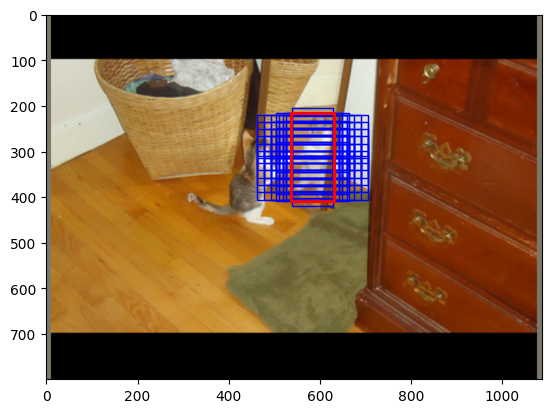

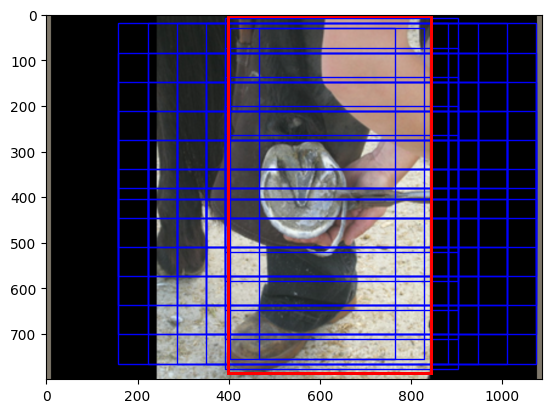

In [20]:
viz_all_pos(gt_, ground_coord_, images_, model)

### Vizualize Ground Truth at each FPN Level

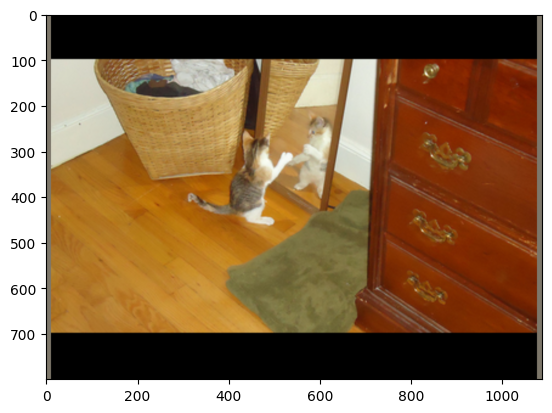

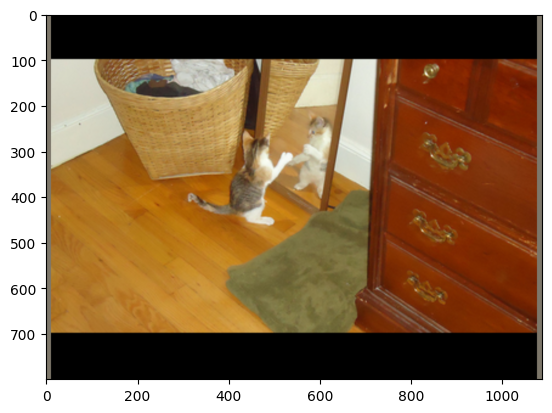

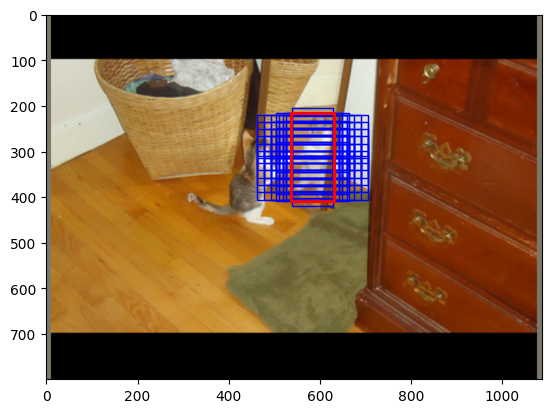

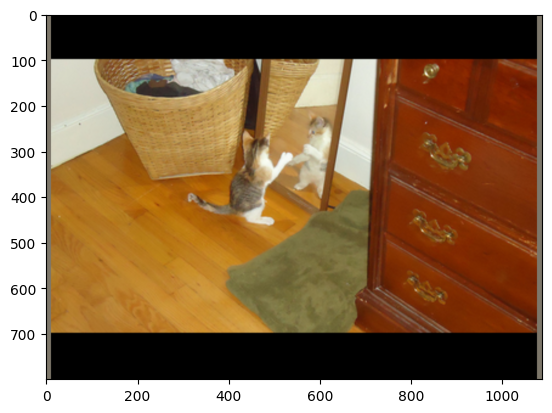

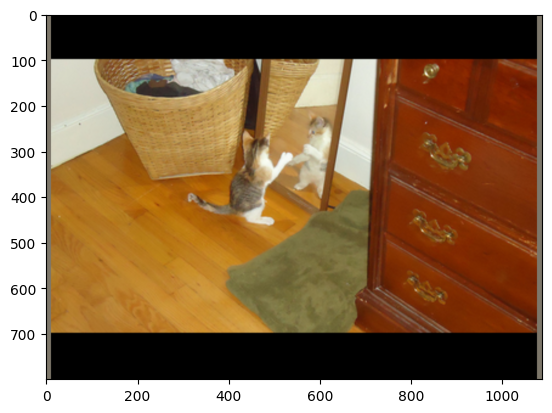

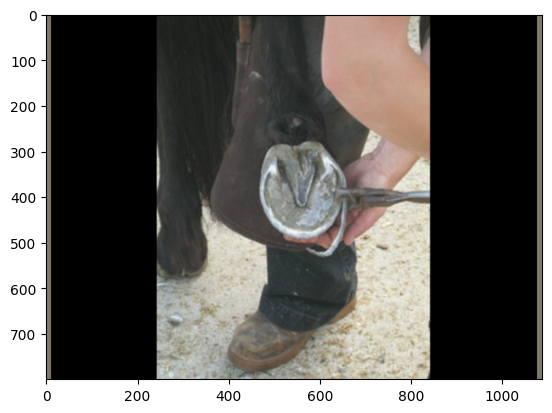

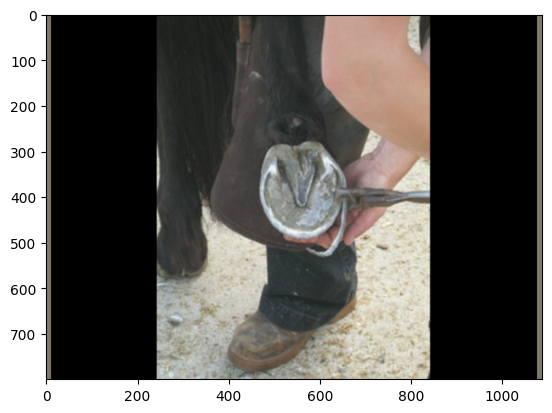

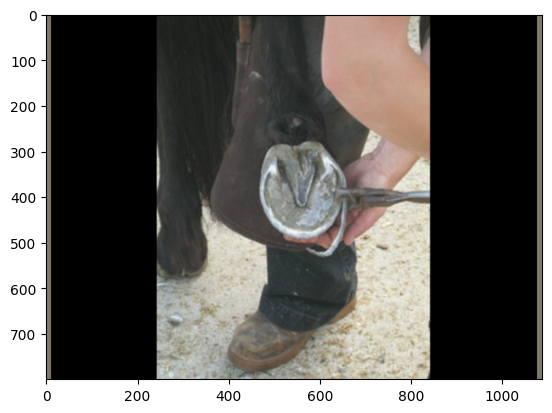

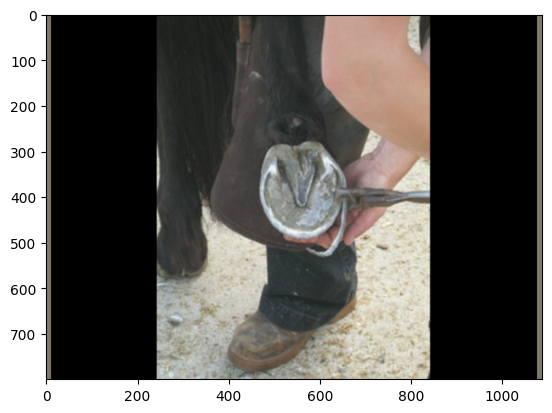

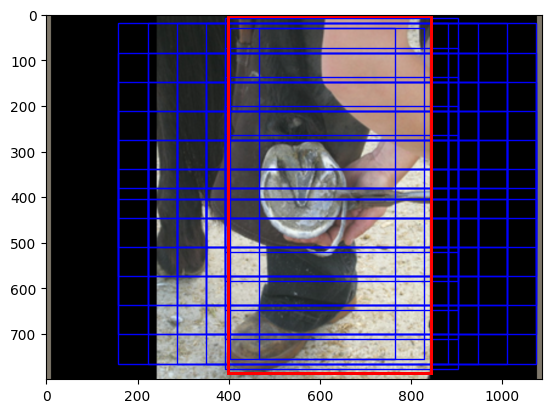

In [21]:
viz_all_levels(gt_, ground_coord_, images_, model)

### Vizualize Ground Truth at across FPN Levels and Each Aspect ratio

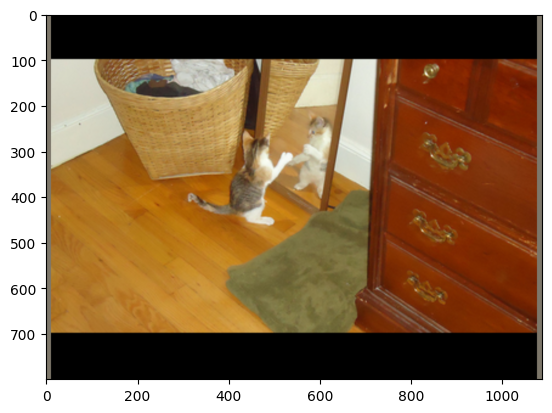

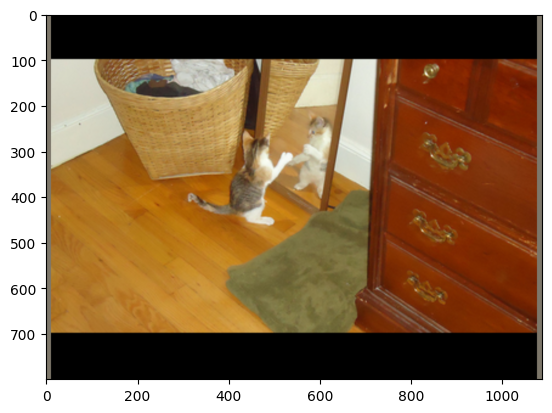

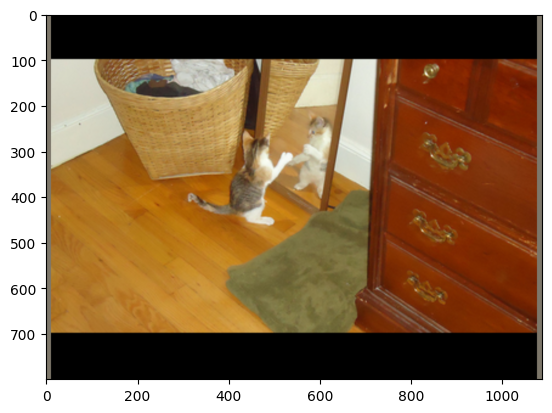

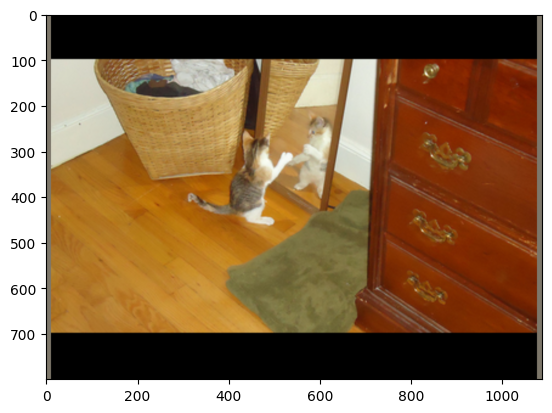

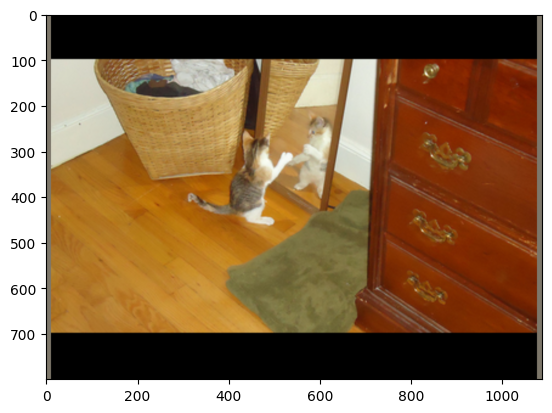

...

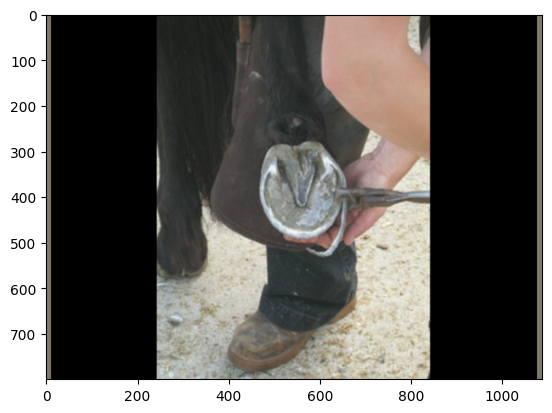

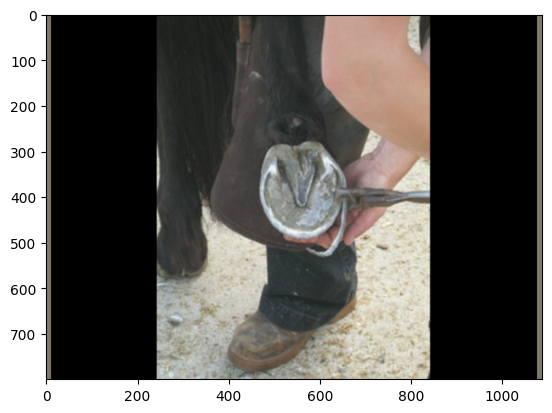

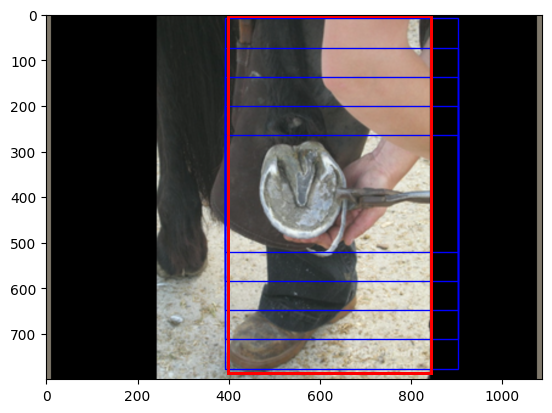

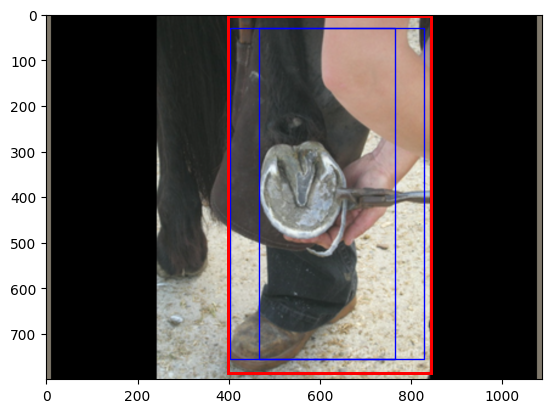

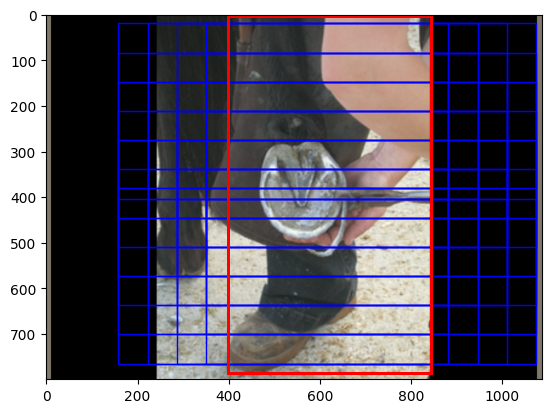

In [22]:
viz_all_levels_all_asp(gt_, ground_coord_, images_, model)

### Top K results

In [ ]:
# After Training 
device='cuda'
model = RPNHead.load_from_checkpoint(checkpoint_path='model.ckpt')
model =  model.to(device)

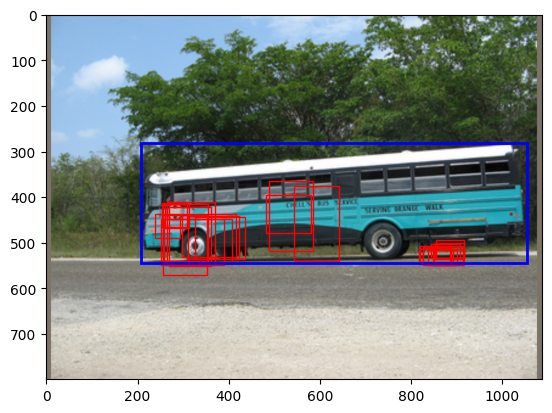

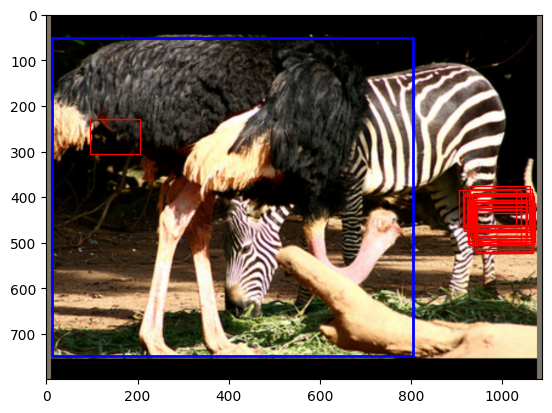

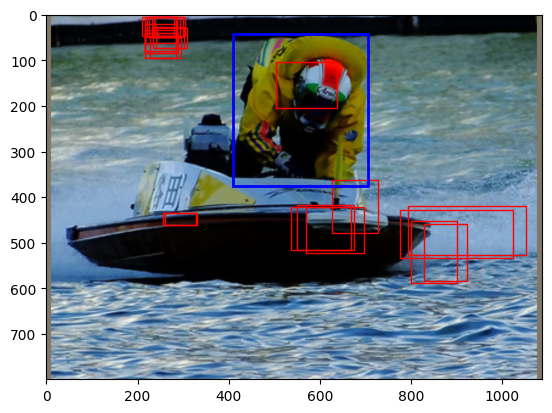

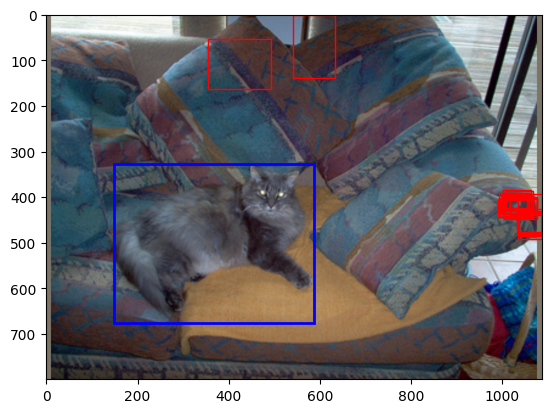

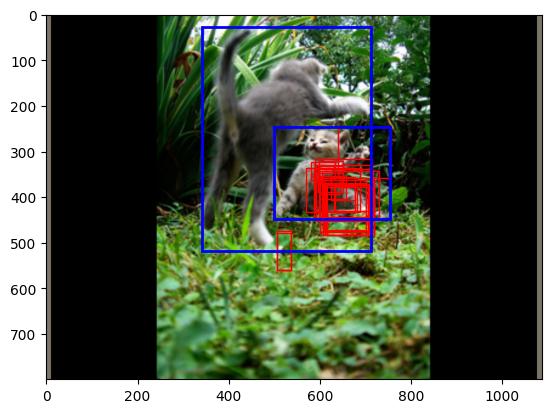

In [27]:
test_loader = torch.utils.data.DataLoader(train_dataset, batch_size=1, shuffle=True, collate_fn=dataset.collate_fn)

for i in range(5):
  images, labels, bbox, masks, index = next(iter(test_loader))
  images=images.to(device)
  model.topK_plotter(images, bbox[0], 25)

### After NMS

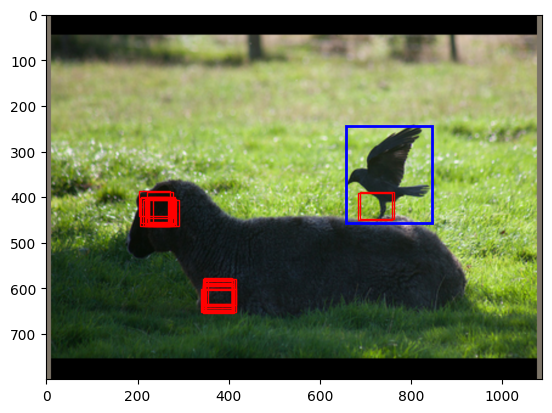

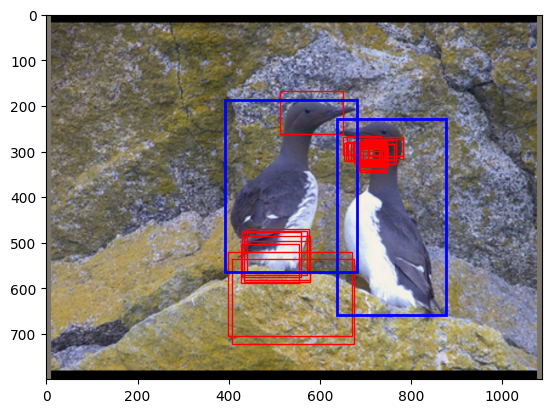

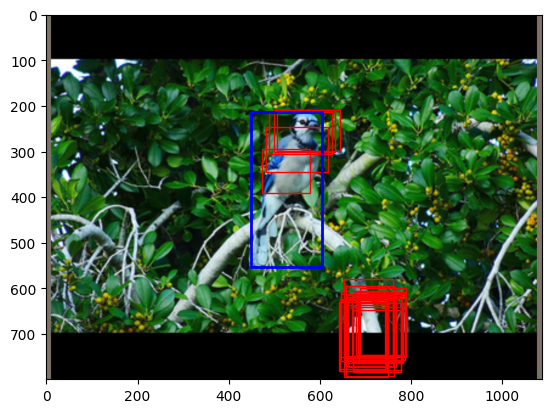

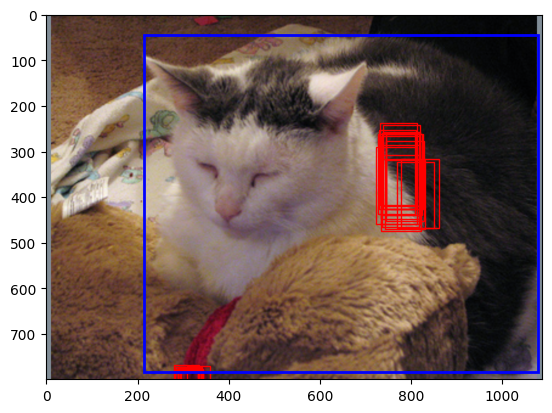

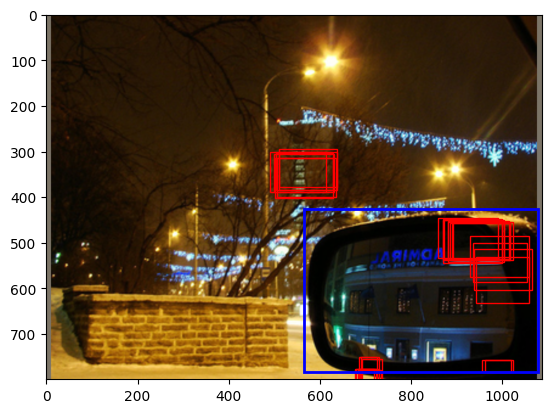

In [28]:
for i in range(5):
  images, labels, bbox, masks, index = next(iter(test_loader))
  images=images.to(device)
  model.nms_plotter(images, bbox[0], 100,30)
  print("================================================================")

In [29]:
%tensorboard

UsageError: Line magic function `%tensorboard` not found.


### Results: Plots

In [30]:
def plot_graphs():
  # Results from Best Model
  total_loss= model.epoch_loss  
  closs=  model.epoch_closs  
  rloss= model.epoch_rloss

  total_val_loss=  model.val_epoch_loss  
  closs_val= model.val_epoch_closs  
  rloss_val=  model.val_epoch_rloss

  # Training Loss vs Epochs
  plt.plot(range(len(total_loss)), total_loss, label="Train Loss")
  plt.plot(range(len(total_val_loss)), total_val_loss, label="Validation Loss")
  plt.title("Epoch Vs Total Loss")
  plt.legend()
  plt.xlabel("Epochs")
  plt.ylabel("Loss")
  plt.show()

  plt.plot(range(len(closs)), closs, label="Train Category Loss")
  plt.plot(range(len(closs_val)), closs_val, label="Validation Category Loss")
  plt.title("Epoch Vs Category Loss")
  plt.legend()
  plt.xlabel("Epochs")
  plt.ylabel("Loss")
  plt.show()

  plt.plot(range(len(rloss)), rloss, label="Train Regressor Loss")
  plt.plot(range(len(rloss_val)), rloss_val, label="Validation Regressor Loss")
  plt.title("Epoch Vs Regressor Loss")
  plt.legend()
  plt.xlabel("Epochs")
  plt.ylabel("Loss")
  plt.show()

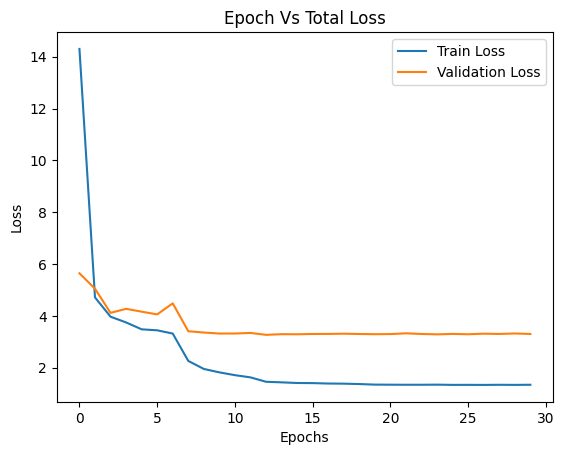

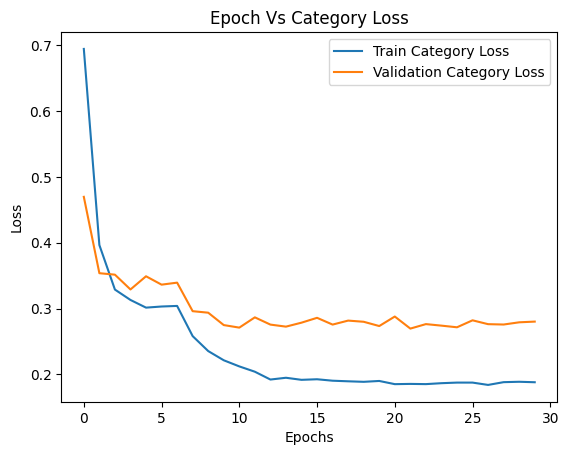

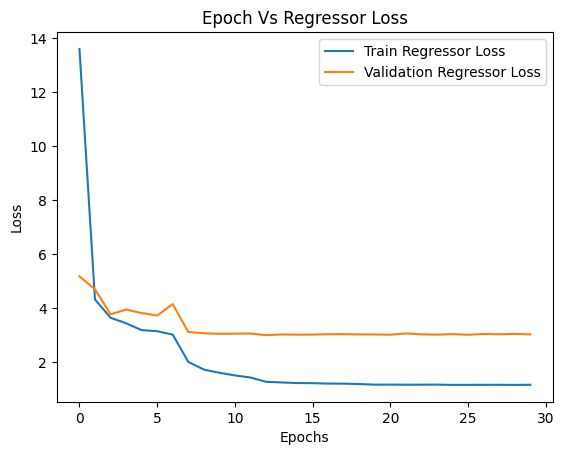

In [31]:
plot_graphs()